# Sanity check for trained model 
This is a mirror of 1.21 except that it evaluates a model trained with a single output class instead of two output classes. Previous models trained with 'absent' and 'present' encoded as different classes.

In [1]:
# imports
from pathlib import Path
import pandas as pd
import sys
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
from src.utils import show_sample_from_df
import pandas as pd
import opensoundscape as opso
from opensoundscape import Audio, Spectrogram
import numpy as np


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
# Load the validation set
valid_set_path = BASE_PATH / 'data' / 'interim' / 'valid_set' 
valid_set = pd.read_pickle(valid_set_path / 'valid_df_verified.pkl')
valid_set = valid_set.drop(columns=["target_absence"])
valid_set.sample(5)

,,,target_presence,confidence_cat
file,start_time,end_time,,
../../data/raw/recordings/OSFL/recording-556147.flac,4.5,7.5,0.0,0
../../data/raw/recordings/OSFL/recording-555641.flac,4.5,7.5,0.0,0
../../data/raw/recordings/OSFL/recording-292376.mp3,100.5,103.5,0.0,0
../../data/raw/recordings/OSFL/recording-4726.flac,66.0,69.0,0.0,0
../../data/raw/recordings/OSFL/recording-622397.flac,9.0,12.0,0.0,0


In [3]:
# Take a sample of 10 from each class
present_samples = valid_set.loc[valid_set['target_presence']==1].sample(10)
absent_samples = valid_set.loc[valid_set['target_presence']==0].sample(10)
present_samples.index[0]

(PosixPath('../../data/raw/recordings/OSFL/recording-553514.flac'), 4.5, 7.5)

In [4]:
# Load a trained model. 
model = opso.cnn.load_model(BASE_PATH / 'models' / 'osfl_model_single_neuron2024-03-07')
model.valid_metrics

{0: {'target_presence': {'au_roc': 0.637124,
   'avg_precision': 0.6542009838801834,
   'precision': 0.6127946127946128,
   'recall': 0.364,
   'f1': 0.4567126725219573,
   'support': 500},
  'precision': 0.5802237644342907,
  'recall': 0.567,
  'f1': 0.5483895864687924,
  'jaccard': 0.38329755302443,
  'hamming_loss': 0.433,
  'map': 0.6542009838801834,
  'au_roc': 0.637124},
 1: {'target_presence': {'au_roc': 0.8539680000000001,
   'avg_precision': 0.8835930434885025,
   'precision': 0.7306501547987616,
   'recall': 0.944,
   'f1': 0.8237347294938918,
   'support': 500},
  'precision': 0.8257770548005108,
  'recall': 0.798,
  'f1': 0.7936003858242293,
  'jaccard': 0.6588604891646435,
  'hamming_loss': 0.202,
  'map': 0.8835930434885025,
  'au_roc': 0.8539680000000001},
 2: {'target_presence': {'au_roc': 0.8949040000000001,
   'avg_precision': 0.911936395763816,
   'precision': 0.8551401869158879,
   'recall': 0.732,
   'f1': 0.7887931034482759,
   'support': 500},
  'precision': 0.81

In [5]:
valid_set_preds = model.predict(valid_set, batch_size=32, activation_layer='sigmoid')

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/344 [00:00<?, ?it/s]

In [6]:
valid_set.columns, valid_set_preds.columns

(Index(['target_presence', 'confidence_cat'], dtype='object'),
 Index(['target_presence'], dtype='object'))

# Sigmoid or Softmax activation?
Choose Sigmoid, because Softmax doesn't make sense for the binary case. Sigmoid will also create a smoother probability distribution than softmax due to the lack of the exponent in the formula. 

In [7]:
# Example sigmoid outputs
present_preds = model.predict(present_samples, activation_layer='sigmoid')
absent_preds = model.predict(absent_samples, activation_layer='sigmoid')
present_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)
absent_preds.rename(columns={"target_presence": "present_pred"}, inplace=True)


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10 [00:00<?, ?it/s]

In [8]:

# combine labels and predictions for samples of present and absent classes
present_labels_and_preds = pd.concat([present_samples, present_preds], axis=1)
absent_labels_and_preds = pd.concat([absent_samples, absent_preds], axis=1)
combined = pd.concat([present_labels_and_preds, absent_labels_and_preds], axis=0)

In [46]:
def show_example(counter):
    path, offset, end_time = combined.index[counter]
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spectrogram = Spectrogram.from_audio(audio)
    print(path, offset, end_time)
    print(audio.metadata)
    print(f"Label confidence {combined.iloc[counter].confidence_cat}")
    print("1 = Discard, 2 = unsure, 3 = confirmed, 4 = focal, 0 = un-verified")
    print(f"Present Prediction = {combined.iloc[counter].present_pred} \nActual = {combined.iloc[counter].target_presence}")
    print("Check below")
    audio.show_widget()
    spectrogram.plot()
    counter += 1
    return counter


# Show Predictions
See example labels, predictions, audio and spectrograms below

In [10]:
next_example_idx = 0

../../data/raw/recordings/OSFL/recording-553514.flac 4.5 7.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.905671238899231 
Actual = 1.0
Check below


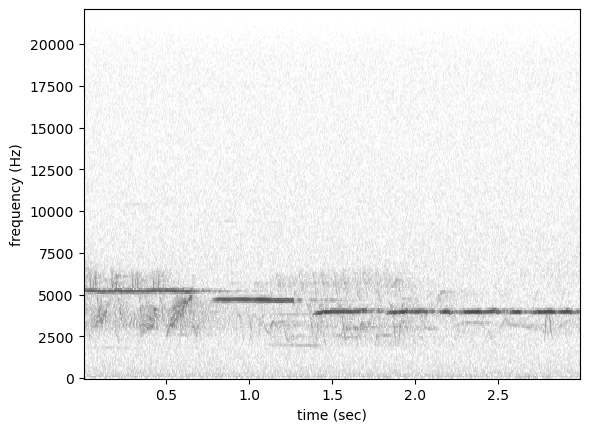

In [11]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-294242.mp3 19.5 22.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.942015528678894 
Actual = 1.0
Check below


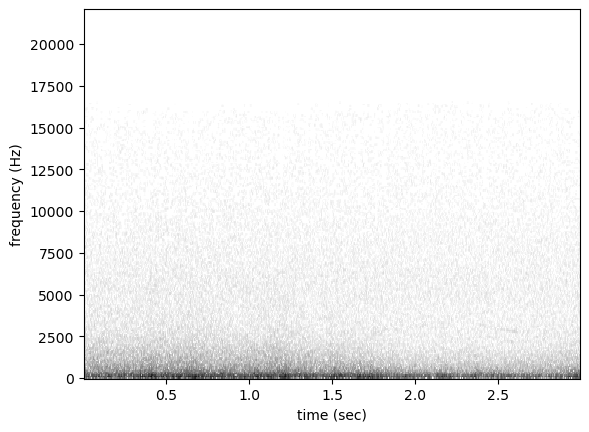

In [12]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552486.flac 1.5 4.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13225973, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.2717546820640564 
Actual = 1.0
Check below


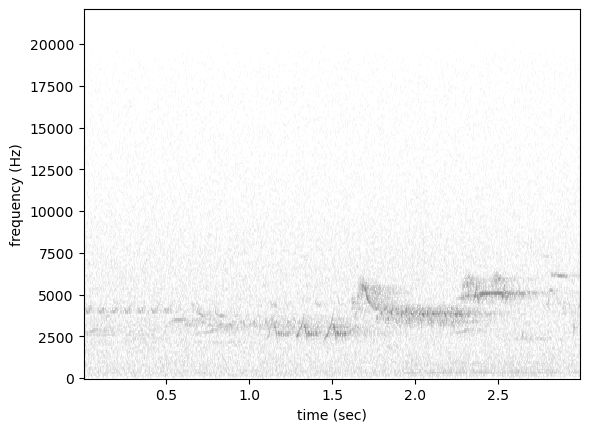

In [13]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-295810.mp3 10.5 13.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.919940710067749 
Actual = 1.0
Check below


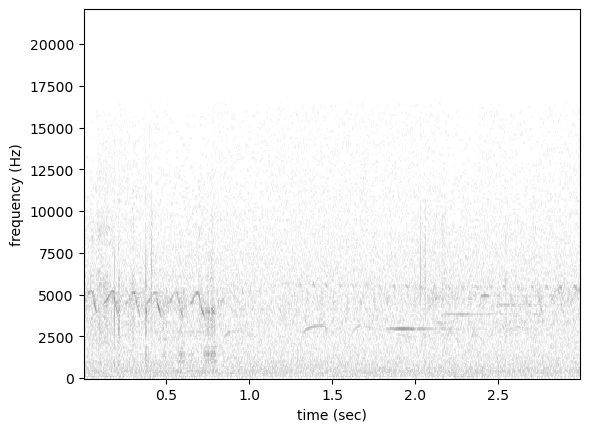

In [14]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-4557.flac 129.0 132.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7938048, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.26685306429862976 
Actual = 1.0
Check below


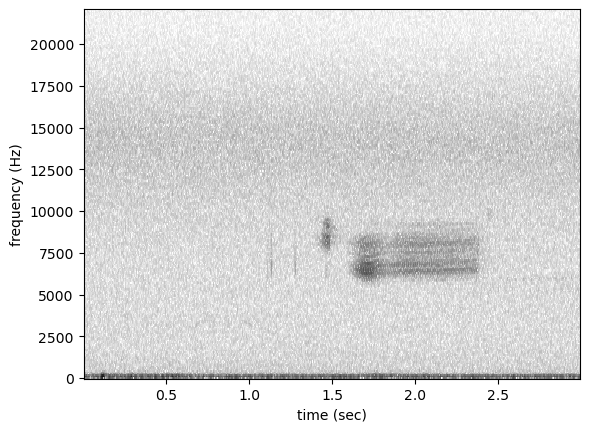

In [15]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-529972.flac 1.5 4.5
{'comment': 'Processed by SoX', 'samplerate': 48000, 'format': 'FLAC', 'frames': 28800128, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 3.0
Present Prediction = 0.9998701810836792 
Actual = 1.0
Check below


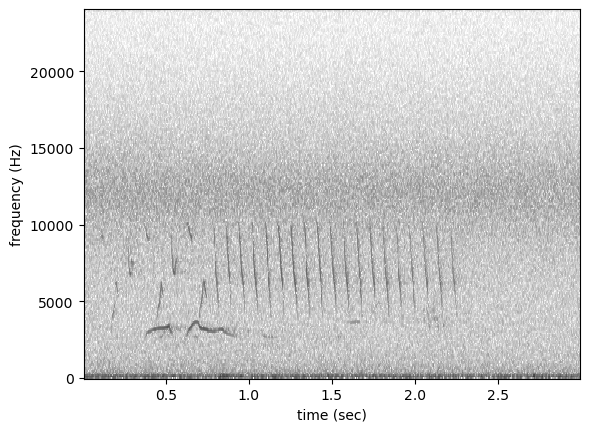

In [16]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-554245.flac 16.5 19.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 3.0
Present Prediction = 0.9995192289352417 
Actual = 1.0
Check below


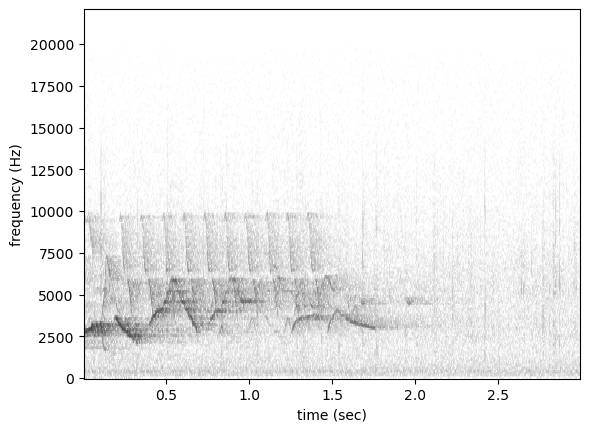

In [17]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-255544.flac 6.0 9.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 26371584, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 3.0
Present Prediction = 0.9988852143287659 
Actual = 1.0
Check below


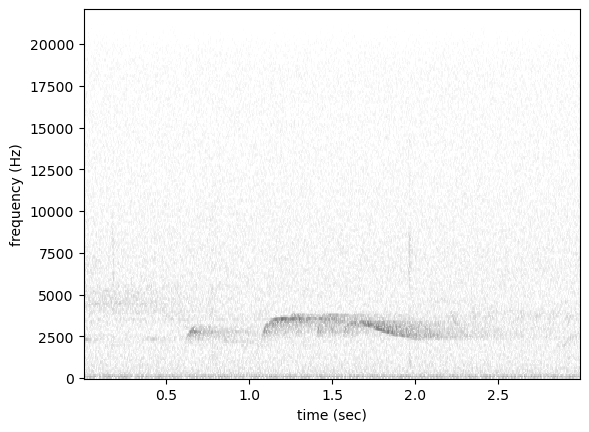

In [18]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-297262.mp3 3.0 6.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 1.0
Present Prediction = 0.14190499484539032 
Actual = 1.0
Check below


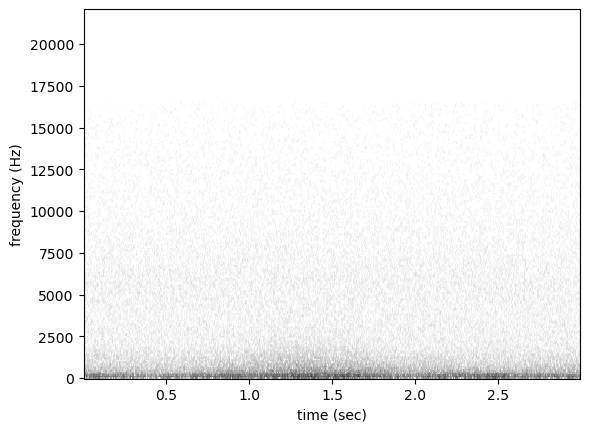

In [19]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-296963.mp3 9.0 12.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 2653384, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 2.0
Present Prediction = 0.6964432597160339 
Actual = 1.0
Check below


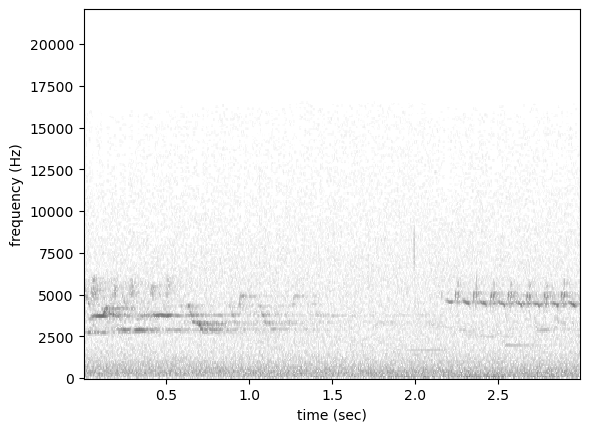

In [20]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-280093.mp3 13.5 16.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.023729337379336357 
Actual = 0.0
Check below


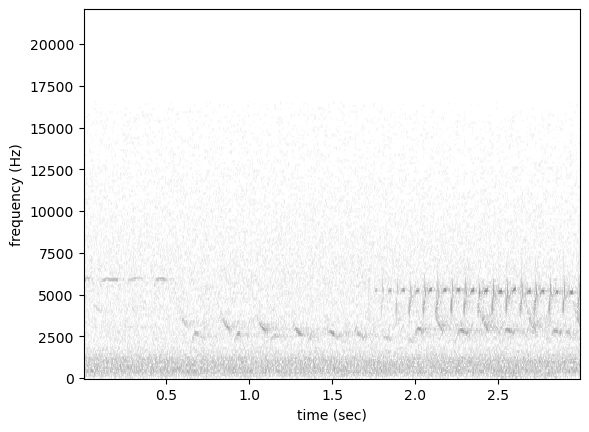

In [21]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-293057.mp3 105.0 108.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.08720985800027847 
Actual = 0.0
Check below


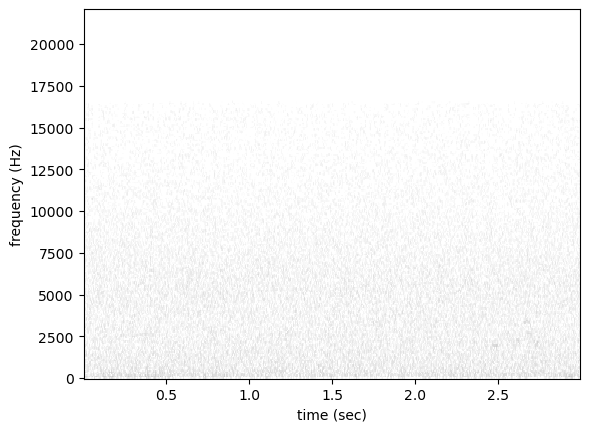

In [22]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-482026.flac 97.5 100.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13230000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.009794618003070354 
Actual = 0.0
Check below


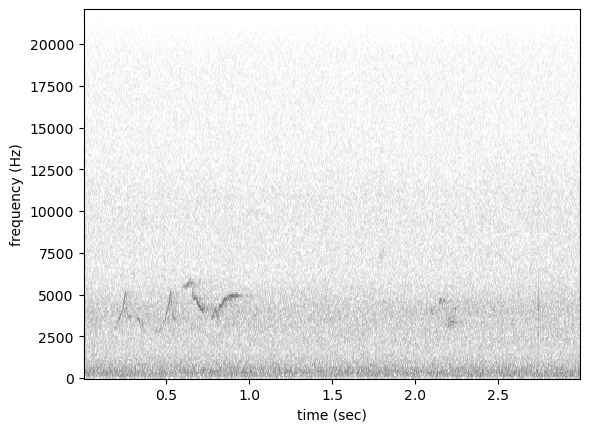

In [23]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-315817.mp3 19.5 22.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 7957844, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.966200053691864 
Actual = 0.0
Check below


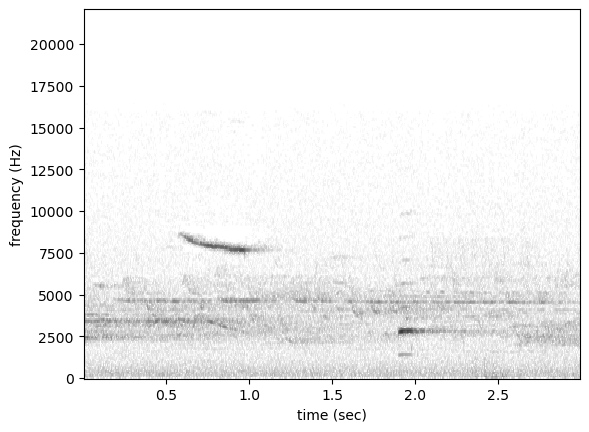

In [24]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-170095.flac 28.5 31.5
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 7937792, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.002860283711925149 
Actual = 0.0
Check below


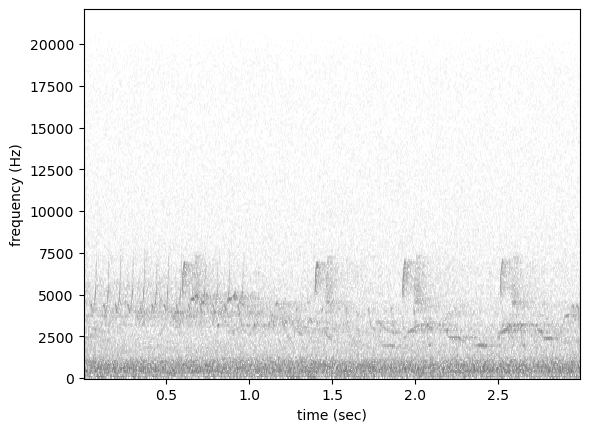

In [25]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-576197.flac 0.0 3.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 2646000, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.026976652443408966 
Actual = 0.0
Check below


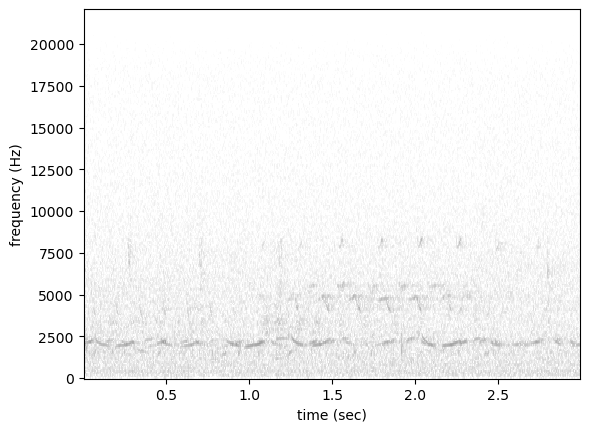

In [26]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-552428.flac 42.0 45.0
{'comment': 'Processed by SoX', 'samplerate': 44100, 'format': 'FLAC', 'frames': 13225973, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.10060028731822968 
Actual = 0.0
Check below


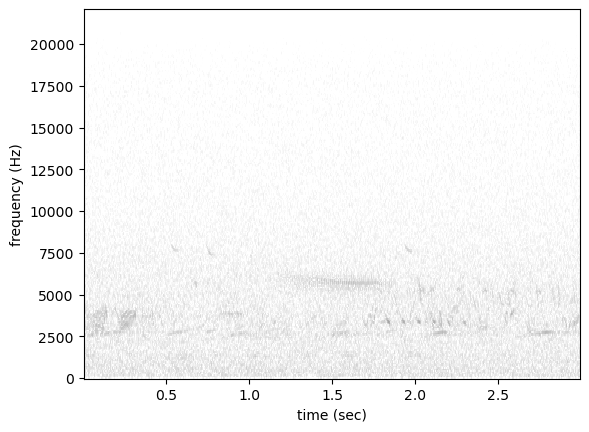

In [27]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-417005.flac 63.0 66.0
{'comment': 'Processed by SoX', 'samplerate': 32000, 'format': 'FLAC', 'frames': 5760128, 'sections': 1, 'subtype': 'PCM_16', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.012593686580657959 
Actual = 0.0
Check below


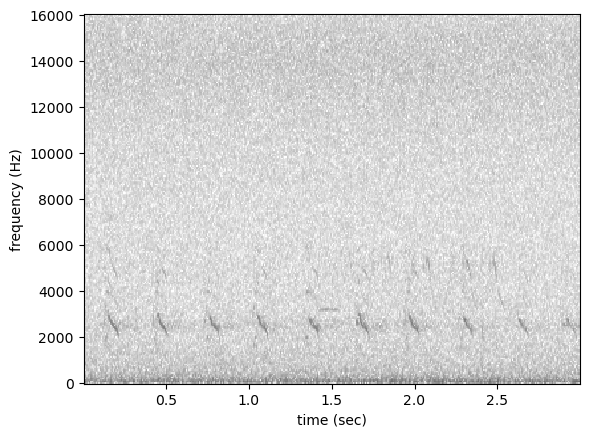

In [28]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-99097.mp3 42.0 45.0
{'samplerate': 44100, 'format': 'MP3', 'frames': 7938048, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.034790825098752975 
Actual = 0.0
Check below


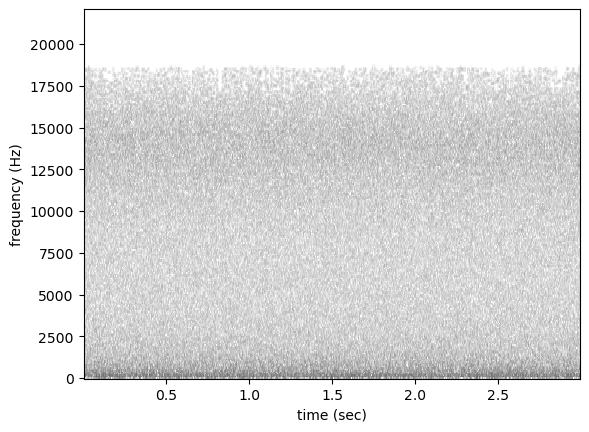

In [29]:
next_example_idx = show_example(next_example_idx)

../../data/raw/recordings/OSFL/recording-292175.mp3 85.5 88.5
{'samplerate': 44100, 'format': 'MP3', 'frames': 13259997, 'sections': 1, 'subtype': 'MPEG_LAYER_III', 'channels': 1, 'duration': 3.0, 'filesize': nan}
Confidence 0.0
Present Prediction = 0.3926489055156708 
Actual = 0.0
Check below


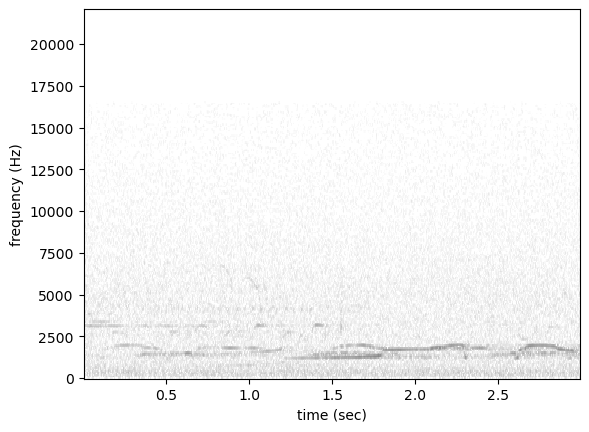

In [30]:
next_example_idx = show_example(next_example_idx)

# Check that the confusion matrix is working properly.

Here's the function which calculates the metrics. 


``` py
def single_target_metrics(targets, scores):
    """generate various metrics for a set of scores and labels (targets)

    Predicts 1 for the highest scoring class per sample and 0 for
    all other classes.

    Args:
        targets: 0/1 lables in 2d array
        scores: continuous values in 2d array

    Returns:
        metrics_dict: dictionary of various overall and per-class metrics

    """
    if max(np.sum(targets, 1)) > 1:
        raise ValueError(
            "Labels were not single target! "
            "Use multi-target classifier if multiple classes can be present "
            "in a single sample."
        )

    metrics_dict = {}

    preds = predict_single_target_labels(scores=scores)

    # Confusion matrix requires numbered-class not one-hot labels
    t = np.argmax(targets, 1)
    p = np.argmax(preds, 1)
    metrics_dict["confusion_matrix"] = M.confusion_matrix(t, p)

    # precision, recall, and f1
    pre, rec, f1, _ = M.precision_recall_fscore_support(
        targets, preds, average=None, zero_division=0
    )
    metrics_dict.update({"precision": pre[1], "recall": rec[1], "f1": f1[1]})

    try:
        metrics_dict["jaccard"] = M.jaccard_score(targets, preds, average="macro")
    except ValueError:
        metrics_dict["jaccard"] = np.nan
    try:
        metrics_dict["hamming_loss"] = M.hamming_loss(targets, preds)
    except ValueError:
        metrics_dict["hamming_loss"] = np.nan

    return metrics_dict
    ```

In [31]:
model.classes

['target_presence']

In [32]:
valid_set_with_confidence = valid_set.copy()
valid_set = valid_set.drop(columns=["confidence_cat"])

In [33]:
valid_set_preds.round()

target_presence
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-4478.mp3  0.0        3.0                   1.0
                                                   1.5        4.5                   0.0
                                                   3.0        6.0                   1.0
                                                   4.5        7.5                   1.0
                                                   6.0        9.0                   1.0
...                                                                                 ...
../../data/raw/recordings/OSFL/recording-816752... 33.0       36.0                  0.0
                                                   34.5       37.5                  0.0
                                                   36.0       39.0                  0.0
                                                   37.5       40.5                  0.0
                                                   40.5       43.5                  1.0

[10990 rows x 1 columns]

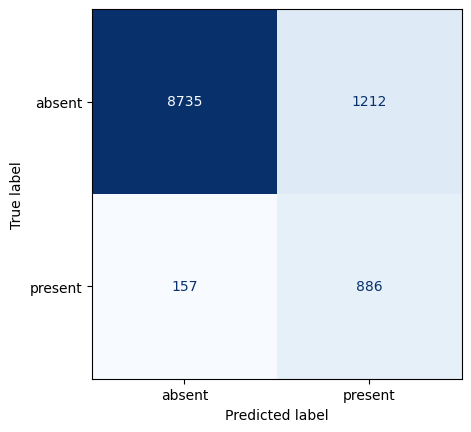

In [34]:
cm = opso.metrics.M.confusion_matrix(valid_set.target_presence, valid_set_preds.round() )
opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels= ["absent", "present"]).plot(cmap='Blues', colorbar=False)

# Understanding the scikitlearn metrics 
### From the skleaern user guide 

#### 3.3. Metrics and scoring: quantifying the quality of predictions¶
##### 3.3.2.1. From binary to multiclass and multilabel

Some metrics are essentially defined for binary classification tasks (e.g. f1_score, roc_auc_score). In these cases, by default only the positive label is evaluated, assuming by default that the positive class is labelled 1 (though this may be configurable through the pos_label parameter).

In extending a binary metric to multiclass or multilabel problems, the data is treated as a collection of binary problems, one for each class. There are then a number of ways to average binary metric calculations across the set of classes, each of which may be useful in some scenario. Where available, you should select among these using the average parameter.

    "macro" simply calculates the mean of the binary metrics, giving equal weight to each class. In problems where infrequent classes are nonetheless important, macro-averaging may be a means of highlighting their performance. On the other hand, the assumption that all classes are equally important is often untrue, such that macro-averaging will over-emphasize the typically low performance on an infrequent class.

    "weighted" accounts for class imbalance by computing the average of binary metrics in which each class’s score is weighted by its presence in the true data sample.

    "micro" gives each sample-class pair an equal contribution to the overall metric (except as a result of sample-weight). Rather than summing the metric per class, this sums the dividends and divisors that make up the per-class metrics to calculate an overall quotient. Micro-averaging may be preferred in multilabel settings, including multiclass classification where a majority class is to be ignored.

    "samples" applies only to multilabel problems. It does not calculate a per-class measure, instead calculating the metric over the true and predicted classes for each sample in the evaluation data, and returning their (sample_weight-weighted) average.

    Selecting average=None will return an array with the score for each class.


The precision calculation from sklearn should be ordered like this. 

![Screenshot 2024-02-27 at 11.51.53.png](<attachment:Screenshot 2024-02-27 at 11.51.53.png>)
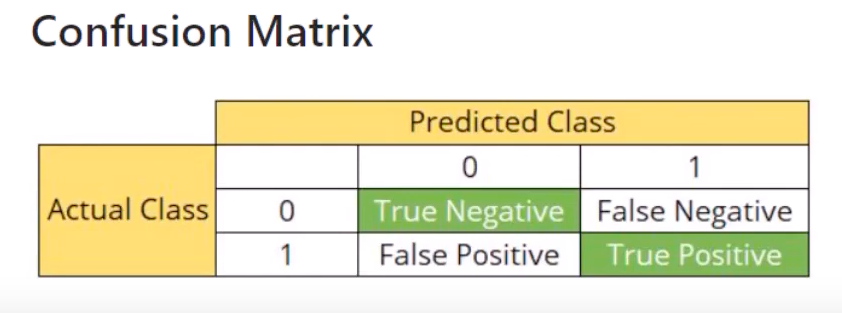

Predicted Class [0, 1] <br>
Actual Class 0 [TN, FN] <br>
Actual Class 1 [FP, TP]

# Plot top losses

In [35]:
valid_set_preds_renamed = valid_set_preds.rename(columns = {'target_presence':'present_pred'})
combined_full = pd.concat([valid_set_with_confidence, valid_set_preds_renamed], axis=1)

combined_full['loss'] = np.abs(combined_full['target_presence'] - combined_full['present_pred'])
top_losses = combined_full.sort_values(by='loss', ascending=False)
best_guesses = combined_full.sort_values(by='loss', ascending=True)

top_losses.head()


,,,target_presence,confidence_cat,present_pred,loss
file,start_time,end_time,,,,
../../data/raw/recordings/OSFL/recording-295476.mp3,1.5,4.5,0.0,0,0.999994,0.999994
../../data/raw/recordings/OSFL/recording-296360.mp3,0.0,3.0,0.0,0,0.999949,0.999949
../../data/raw/recordings/OSFL/recording-554938.flac,30.0,33.0,0.0,0,0.999912,0.999912
../../data/raw/recordings/OSFL/recording-538300.flac,268.5,271.5,0.0,0,0.999899,0.999899
../../data/raw/recordings/OSFL/recording-554941.flac,16.5,19.5,0.0,0,0.999899,0.999899


In [36]:
idx=0

In [37]:

def show_false_negatives(idx):
    df = top_losses.loc[top_losses.target_presence == 1.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_false_positives(idx):
    df = top_losses.loc[top_losses.target_presence == 0.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_true_positives(idx):
    df = best_guesses.loc[best_guesses.target_presence == 1.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

def show_true_negatives(idx):
    df = best_guesses.loc[best_guesses.target_presence == 0.0]
    print(f"Model Confidence = {df.iloc[idx].present_pred}")
    print(f"Actual = {df.iloc[idx].target_presence}")
    show_sample_from_df(df, idx)

In [38]:
idx = 0

Model Confidence = 0.9999935626983643
Actual = 0.0
../../data/raw/recordings/OSFL/recording-295476.mp3 1.5 4.5


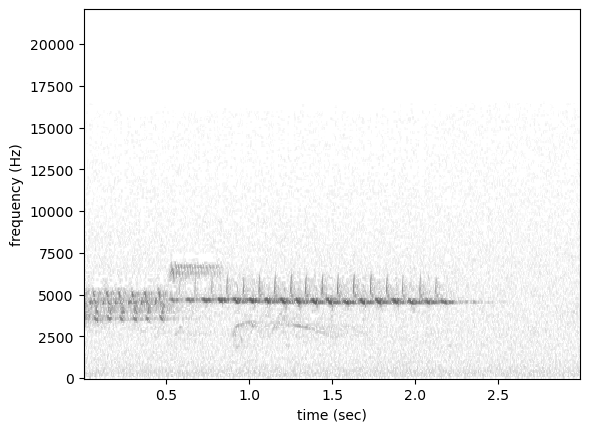

In [39]:
show_false_positives(idx)
idx+=1

Model Confidence = 0.00470482325181365
Actual = 1.0
../../data/raw/recordings/OSFL/recording-553518.flac 6.0 9.0


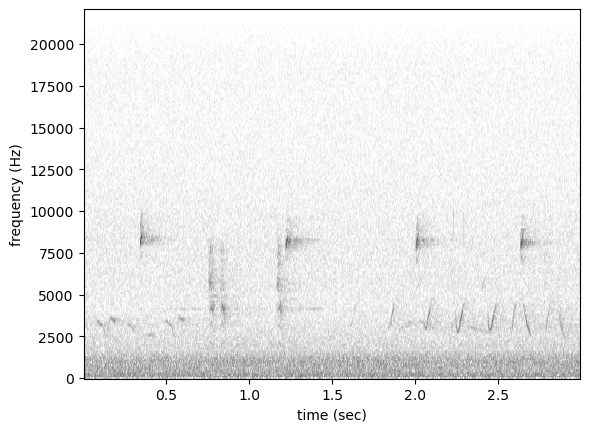

In [40]:
show_false_negatives(idx)
idx+=1

In [41]:
idx=0

Model Confidence = 0.9999992847442627
Actual = 1.0
../../data/raw/recordings/OSFL/recording-622464.flac 0.0 3.0


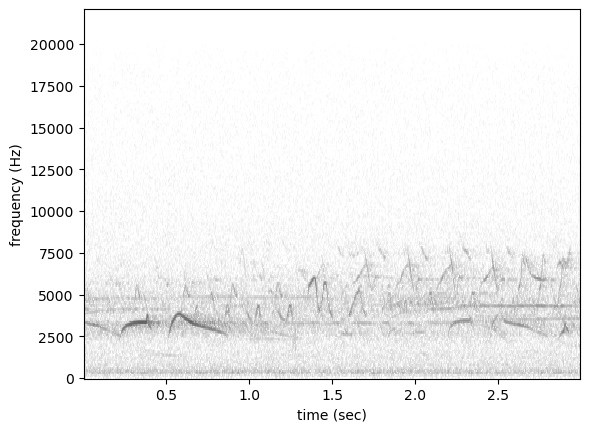

In [42]:
show_true_positives(idx)
idx+=1

In [43]:
idx=0

Model Confidence = 0.0006416921387426555
Actual = 0.0
../../data/raw/recordings/OSFL/recording-554654.flac 13.5 16.5


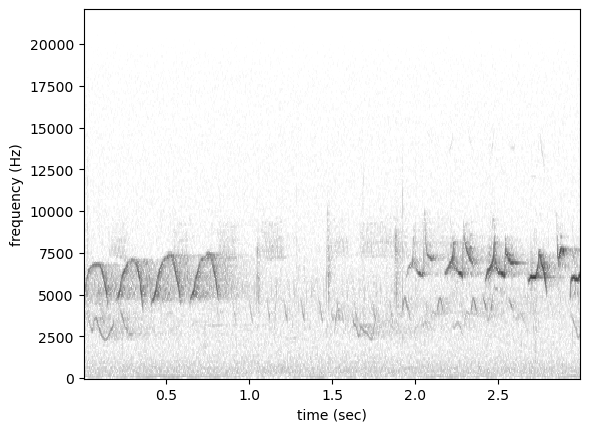

In [44]:
show_true_negatives(idx)
idx+=1

In [70]:
def verify_top_loss_samples(df: pd.DataFrame):
    # Filter the split dataset further into unverified and present tags.
    unverified = df[df['confidence_cat'] == 0]

    # Set the confidence cat to 0 so that any skipped clips or crashes don't get saved as previous confidence.
    confidence = 0

    # Choose the top clip from the loss sorted df 
    clip = unverified.index[0]
    path, offset, end_time = clip
    duration = end_time - offset
    audio = Audio.from_file(path, offset=offset, duration=duration)
    spec = Spectrogram.from_audio(audio)
    print(df.loc[clip])
    audio.show_widget()
    spec.plot()
    user_confidence = input("enter confidence. 1=Discard, 2=Unsure, 3=Verified, 4=Focal, 5=swap-label")

    # save the user input confidence back to the original dataframe.


    df.loc[clip, 'confidence_cat'] = int(user_confidence)
    
    # display the counts
    print(f"added confidence tag {user_confidence} to the dataframe.")
    print(df.loc[df.target_presence == 1.0].value_counts())

    return df

target_presence    0.000000
confidence_cat     0.000000
present_pred       0.999664
loss               0.999664
Name: (../../data/raw/recordings/OSFL/recording-294900.mp3, 1.5, 4.5), dtype: float64


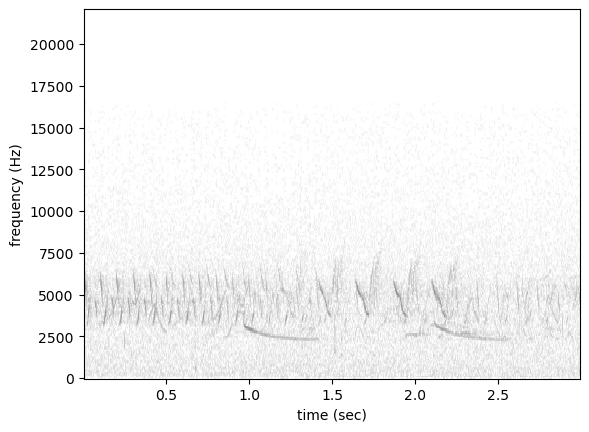

added confidence tag 3 to the dataframe.
target_presence  confidence_cat  present_pred  loss    
1.0              3               0.999668      0.000332    3
                 2               0.992276      0.007724    2
                 3               0.999972      0.000028    2
                                 0.999396      0.000604    2
                                 0.999958      0.000042    2
                                                          ..
                 2               0.720954      0.279046    1
                                 0.737913      0.262087    1
                                 0.754402      0.245598    1
                                 0.759577      0.240423    1
                 4               0.999990      0.000010    1
Name: count, Length: 1037, dtype: int64


/var/folders/hy/36n7jr6x3h74ddx507dc12_00000gn/T/ipykernel_24977/2469673943.py:22: PerformanceWarning: indexing past lexsort depth may impact performance.
  df.loc[clip, 'confidence_cat'] = int(user_confidence)


In [83]:
top_losses = verify_top_loss_samples(top_losses)


In [84]:
top_losses.confidence_cat.value_counts()

confidence_cat
0    9938
2     363
3     359
1     296
4      28
5       6
Name: count, dtype: int64

In [87]:
top_losses.head()

,,,target_presence,confidence_cat,present_pred,loss
file,start_time,end_time,,,,
../../data/raw/recordings/OSFL/recording-295476.mp3,1.5,4.5,0.0,5,0.999994,0.999994
../../data/raw/recordings/OSFL/recording-296360.mp3,0.0,3.0,0.0,5,0.999949,0.999949
../../data/raw/recordings/OSFL/recording-554938.flac,30.0,33.0,0.0,3,0.999912,0.999912
../../data/raw/recordings/OSFL/recording-538300.flac,268.5,271.5,0.0,5,0.999899,0.999899
../../data/raw/recordings/OSFL/recording-554941.flac,16.5,19.5,0.0,5,0.999899,0.999899


<Axes: xlabel='file,start_time,end_time'>

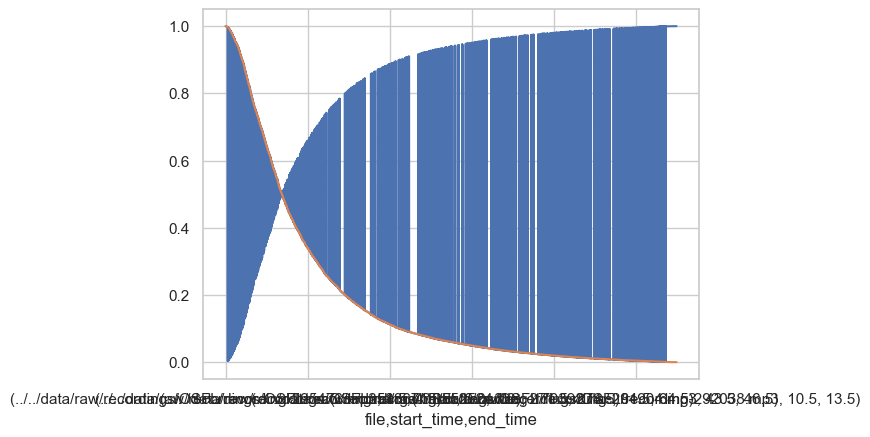

In [118]:
top_losses.present_pred.plot()
top_losses.loss.plot()